In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
%matplotlib inline

C:\Users\91730\AppData\Roaming\Python\Python310\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\91730\AppData\Roaming\Python\Python310\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\91730\AppData\Roaming\Python\Python310\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
inp=['engno','progcycle','set1','set2','set3']
out=['t2','t24','t30','t50','p2','p15','p30','nf','nc','epr','ps30','phi','nrf','nrc','bpr','farb','hrbleed','nfd','pcnfr_d','w31','w32','u1','u2']
col=inp+out
len(col)


28

In [3]:
train1=pd.read_csv('train_FD001.txt',sep=' ')
train1.columns=col
train1=train1.drop(['u1','u2'],axis=1)
train1['engno']


0          1
1          1
2          1
3          1
4          1
        ... 
20625    100
20626    100
20627    100
20628    100
20629    100
Name: engno, Length: 20630, dtype: int64

In [4]:
test1=pd.read_csv('test_FD001.txt',sep=' ')
test1.columns=col
test1=test1.drop(['u1','u2'],axis=1)


In [5]:

x1=list(test1.groupby('engno')['progcycle'].max())
y1=list(train1.groupby('engno')['progcycle'].max())
d=[x1,y1]
l1=pd.DataFrame(data=d)
l1


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,31,49,126,106,98,105,160,166,55,192,...,234,150,244,133,89,97,134,121,97,198
1,192,287,179,189,269,188,259,150,201,222,...,135,341,155,258,283,336,202,156,185,200


In [6]:
fail=l1.max()
engno=range(1,101)

    
failure=pd.DataFrame(data=fail)
failure['engno']=engno


failure

,0,engno
0,192,1
1,287,2
2,179,3
3,189,4
4,269,5
...,...,...
95,336,96
96,202,97
97,156,98
98,185,99


In [7]:
train1=train1.merge(failure,on='engno')

In [8]:
train1.columns=[['engno', 'progcycle', 'set1', 'set2', 'set3', 't2', 't24', 't30', 't50',
       'p2', 'p15', 'p30', 'nf', 'nc', 'epr', 'ps30', 'phi', 'nrf', 'nrc',
       'bpr', 'farb', 'hrbleed', 'nfd', 'pcnfr_d', 'w31', 'w32','maxcycle']]
train1['RUL']=np.array(train1['maxcycle'])-np.array(train1['progcycle'])

In [9]:
train1['engno']

,engno
0,1
1,1
2,1
3,1
4,1
...,...
20625,100
20626,100
20627,100
20628,100


<AxesSubplot:xlabel='None', ylabel='None'>

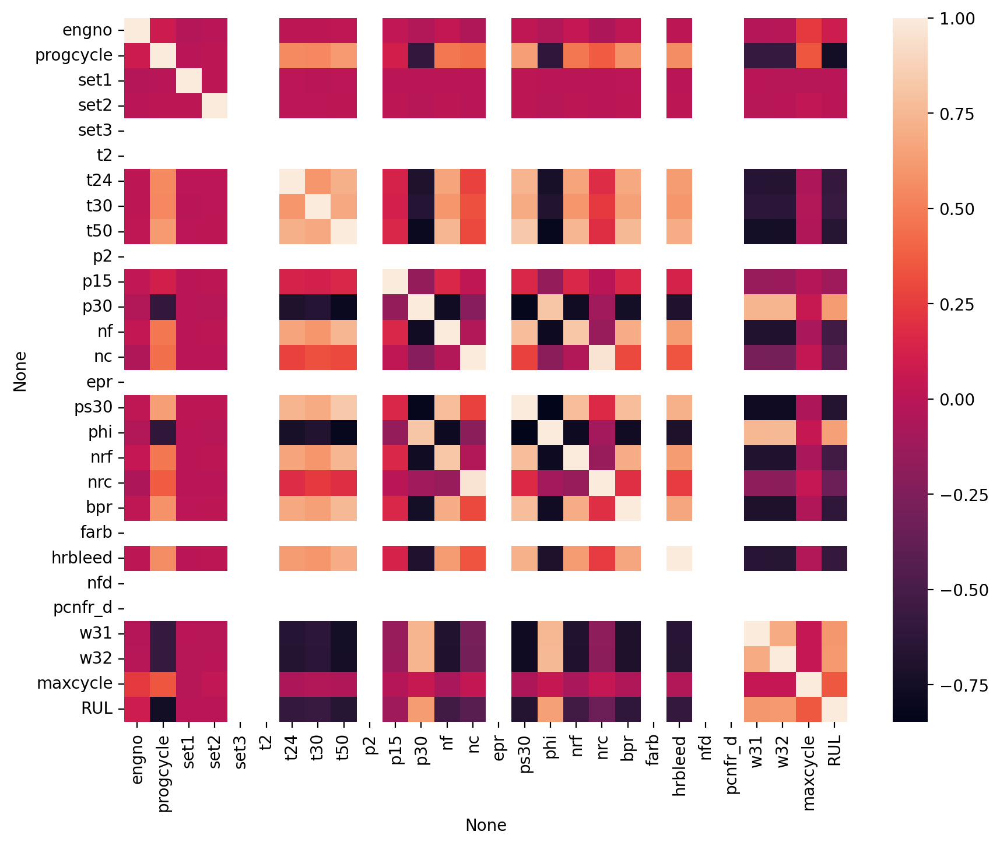

In [10]:
plt.figure(figsize=(10,8),dpi=200)
sns.heatmap(train1.corr())


In [11]:
train1.corr()['RUL']

,RUL
engno,0.087603
progcycle,-0.755998
set1,-0.005405
set2,0.002602
set3,NaN
t2,NaN
t24,-0.587610
t30,-0.568283
t50,-0.655725
p2,NaN


<AxesSubplot:xlabel='None', ylabel='None'>

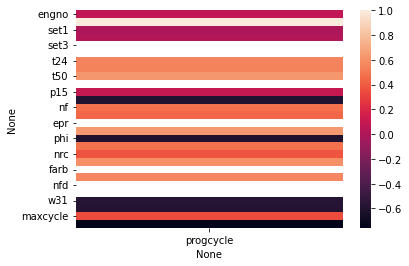

In [12]:

sns.heatmap(train1.corr()['progcycle'])

In [13]:
train1

,engno,progcycle,set1,set2,set3,t2,t24,t30,t50,p2,...,nrc,bpr,farb,hrbleed,nfd,pcnfr_d,w31,w32,maxcycle,RUL
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,192,190
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,192,189
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,192,188
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,192,187
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669,192,186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20625,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,200,4
20626,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,200,3
20627,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,200,2
20628,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,200,1


In [14]:
from sklearn.feature_selection import mutual_info_classif

In [15]:
X_train=train1.drop(['maxcycle','RUL'],axis=1)
X_train

C:\Users\91730\AppData\Local\Temp\ipykernel_24976\3215145796.py:1: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  X_train=train1.drop(['maxcycle','RUL'],axis=1)


,engno,progcycle,set1,set2,set3,t2,t24,t30,t50,p2,...,phi,nrf,nrc,bpr,farb,hrbleed,nfd,pcnfr_d,w31,w32
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20625,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20626,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20627,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20628,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


In [16]:
y_train=train1['RUL']
y_train

,RUL
0,190
1,189
2,188
3,187
4,186
...,...
20625,4
20626,3
20627,2
20628,1


In [17]:
mic=mutual_info_classif(X_train,y_train,discrete_features='auto')

C:\Users\91730\AppData\Roaming\Python\Python310\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [18]:
mic

array([0.        , 0.66302587, 0.        , 0.        , 0.06502404,
       0.07232147, 0.30508832, 0.28585825, 0.40604675, 0.0773926 ,
       0.08223493, 0.37660951, 0.216026  , 0.22774655, 0.07239837,
       0.44929588, 0.38381573, 0.21706366, 0.23104183, 0.36073296,
       0.06002774, 0.315384  , 0.07956604, 0.05993269, 0.34035908,
       0.34869437])

In [19]:
da={'feature':col[:-2],'mic':mic}
da

{'feature': ['engno',
  'progcycle',
  'set1',
  'set2',
  'set3',
  't2',
  't24',
  't30',
  't50',
  'p2',
  'p15',
  'p30',
  'nf',
  'nc',
  'epr',
  'ps30',
  'phi',
  'nrf',
  'nrc',
  'bpr',
  'farb',
  'hrbleed',
  'nfd',
  'pcnfr_d',
  'w31',
  'w32'],
 'mic': array([0.        , 0.66302587, 0.        , 0.        , 0.06502404,
        0.07232147, 0.30508832, 0.28585825, 0.40604675, 0.0773926 ,
        0.08223493, 0.37660951, 0.216026  , 0.22774655, 0.07239837,
        0.44929588, 0.38381573, 0.21706366, 0.23104183, 0.36073296,
        0.06002774, 0.315384  , 0.07956604, 0.05993269, 0.34035908,
        0.34869437])}

In [20]:
mic_df=pd.DataFrame(data=da)
mic_df

,feature,mic
0,engno,0.000000
1,progcycle,0.663026
2,set1,0.000000
3,set2,0.000000
4,set3,0.065024
5,t2,0.072321
6,t24,0.305088
7,t30,0.285858
8,t50,0.406047
9,p2,0.077393


In [21]:
related_features=['engno']+list(mic_df[mic>0.2]['feature'])

In [22]:
X_train1=pd.DataFrame()
for i in related_features:
    X_train1[i]=X_train[i]
    

In [23]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()

In [24]:
import tensorflow as tf
from keras.models import Sequential 
from keras.layers import Activation, Dense, Dropout,LSTM
from tensorflow.keras.losses import mean_squared_error

C:\Users\91730\AppData\Roaming\Python\Python310\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


engno
1      AxesSubplot(0.125,0.125;0.775x0.755)
2      AxesSubplot(0.125,0.125;0.775x0.755)
3      AxesSubplot(0.125,0.125;0.775x0.755)
4      AxesSubplot(0.125,0.125;0.775x0.755)
5      AxesSubplot(0.125,0.125;0.775x0.755)
                       ...                 
96     AxesSubplot(0.125,0.125;0.775x0.755)
97     AxesSubplot(0.125,0.125;0.775x0.755)
98     AxesSubplot(0.125,0.125;0.775x0.755)
99     AxesSubplot(0.125,0.125;0.775x0.755)
100    AxesSubplot(0.125,0.125;0.775x0.755)
Length: 100, dtype: object

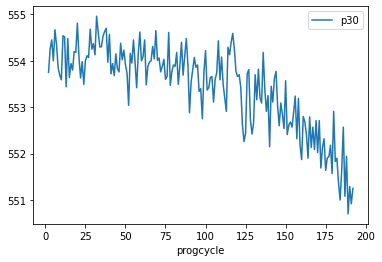

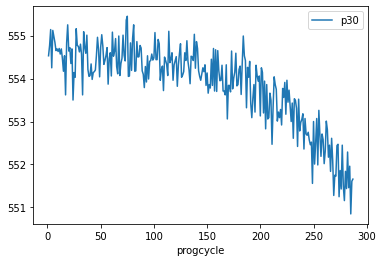

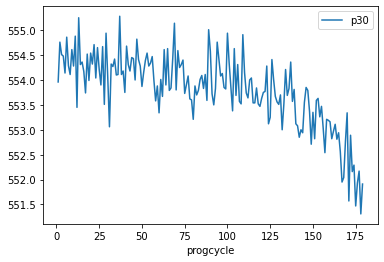

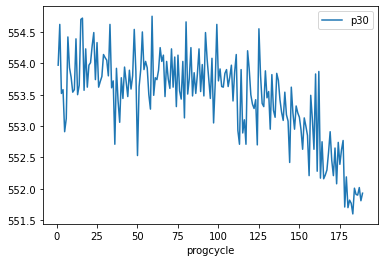

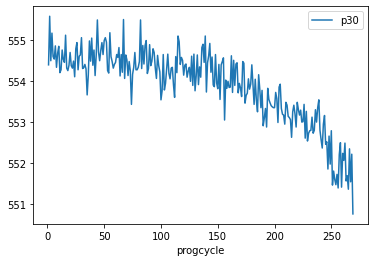

...

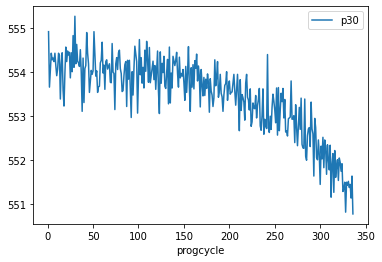

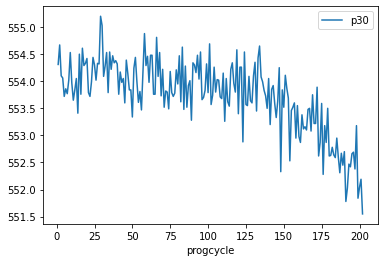

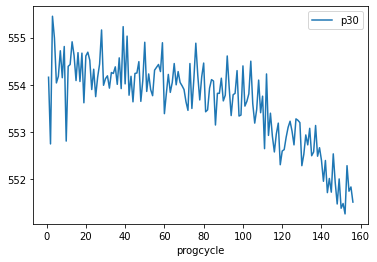

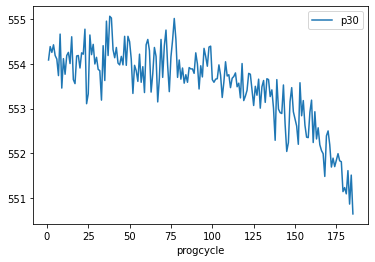

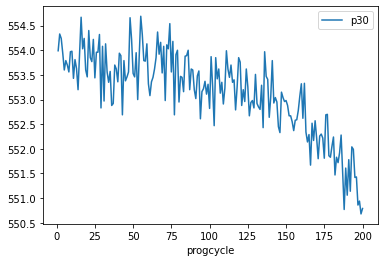

In [25]:
X_train1.groupby('engno').plot('progcycle','p30')

C:\Users\91730\AppData\Roaming\Python\Python310\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


engno
1      AxesSubplot(0.125,0.125;0.775x0.755)
2      AxesSubplot(0.125,0.125;0.775x0.755)
3      AxesSubplot(0.125,0.125;0.775x0.755)
4      AxesSubplot(0.125,0.125;0.775x0.755)
5      AxesSubplot(0.125,0.125;0.775x0.755)
                       ...                 
96     AxesSubplot(0.125,0.125;0.775x0.755)
97     AxesSubplot(0.125,0.125;0.775x0.755)
98     AxesSubplot(0.125,0.125;0.775x0.755)
99     AxesSubplot(0.125,0.125;0.775x0.755)
100    AxesSubplot(0.125,0.125;0.775x0.755)
Length: 100, dtype: object

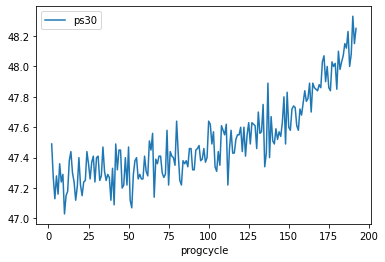

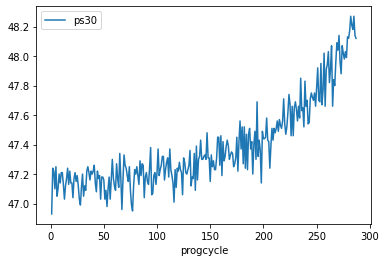

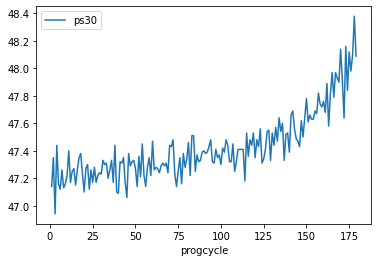

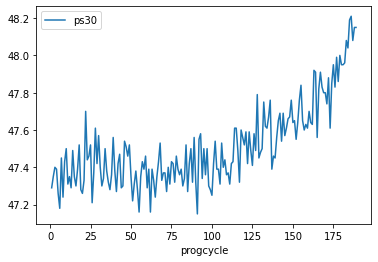

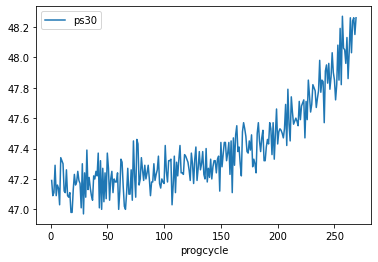

...

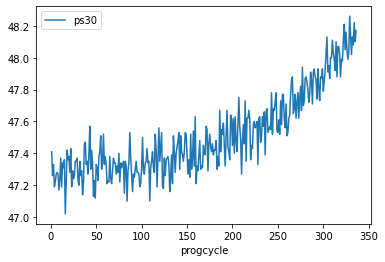

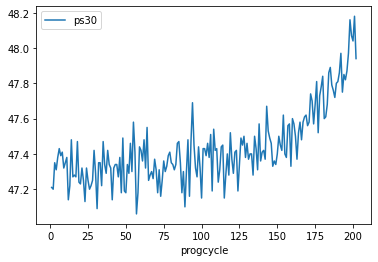

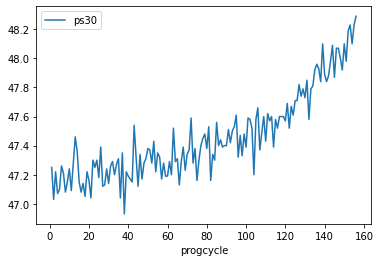

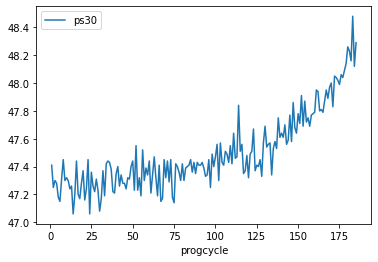

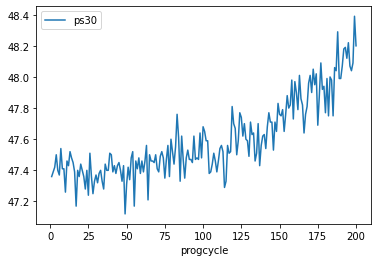

In [26]:
X_train1.groupby('engno').plot('progcycle','ps30')

C:\Users\91730\AppData\Roaming\Python\Python310\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


engno
1      AxesSubplot(0.125,0.125;0.775x0.755)
2      AxesSubplot(0.125,0.125;0.775x0.755)
3      AxesSubplot(0.125,0.125;0.775x0.755)
4      AxesSubplot(0.125,0.125;0.775x0.755)
5      AxesSubplot(0.125,0.125;0.775x0.755)
                       ...                 
96     AxesSubplot(0.125,0.125;0.775x0.755)
97     AxesSubplot(0.125,0.125;0.775x0.755)
98     AxesSubplot(0.125,0.125;0.775x0.755)
99     AxesSubplot(0.125,0.125;0.775x0.755)
100    AxesSubplot(0.125,0.125;0.775x0.755)
Length: 100, dtype: object

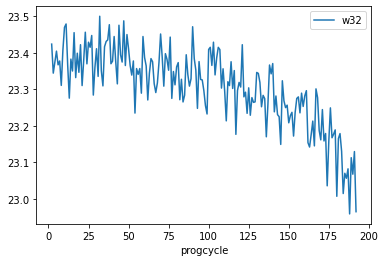

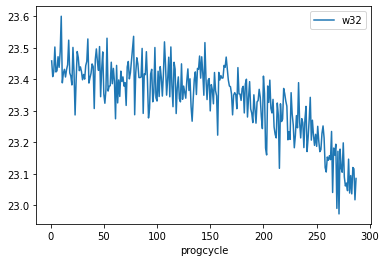

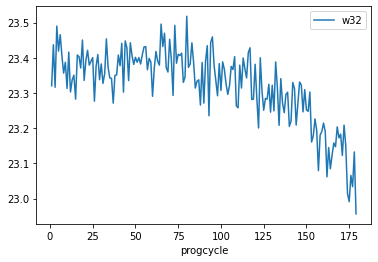

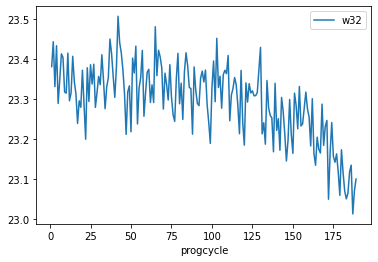

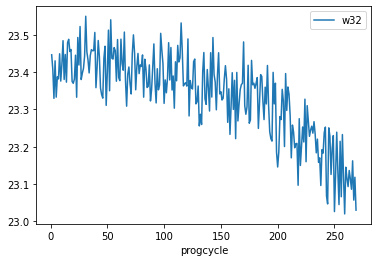

...

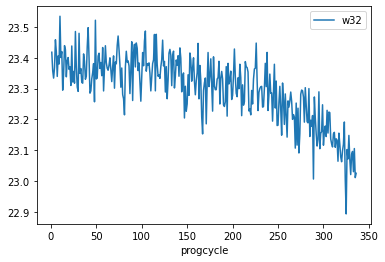

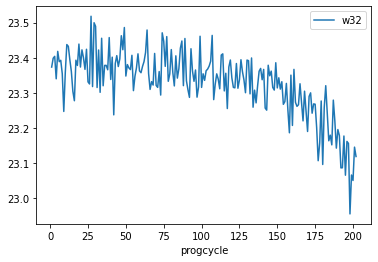

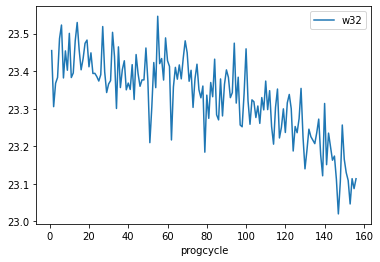

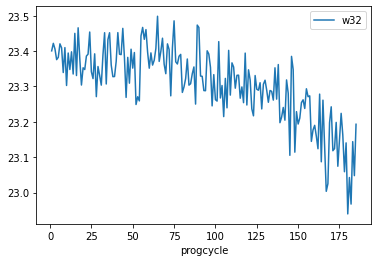

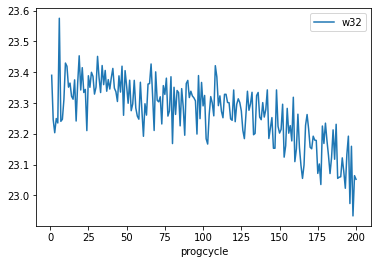

In [29]:
X_train1.groupby('engno').plot('progcycle','w32')

In [30]:
X_train1

,engno,progcycle,t24,t30,t50,p30,nf,nc,ps30,phi,nrf,nrc,bpr,hrbleed,w31,w32
0,1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236
1,1,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442
2,1,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739
3,1,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044
4,1,6,642.10,1584.47,1398.37,554.67,2388.02,9049.68,47.16,521.68,2388.03,8132.85,8.4108,391,38.98,23.3669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20625,100,196,643.49,1597.98,1428.63,551.43,2388.19,9065.52,48.07,519.49,2388.26,8137.60,8.4956,397,38.49,22.9735
20626,100,197,643.54,1604.50,1433.58,550.86,2388.23,9065.11,48.04,519.68,2388.22,8136.50,8.5139,395,38.30,23.1594
20627,100,198,643.42,1602.46,1428.18,550.94,2388.24,9065.90,48.09,520.01,2388.24,8141.05,8.5646,398,38.44,22.9333
20628,100,199,643.23,1605.26,1426.53,550.68,2388.25,9073.72,48.39,519.67,2388.23,8139.29,8.5389,395,38.29,23.0640


In [31]:
from tslearn.preprocessing import TimeSeriesResampler

resampled_X = TimeSeriesResampler(sz=X_train1.shape[1]).fit_transform(X_train1)

In [32]:
resampled_X.shape

(20630, 16, 1)

In [38]:
Xtrain={}
for engno in range(len(X_train1['engno'].unique())):
    Xtrain[engno]=X_train1.query('engno=='+str(engno)).stack()

    

In [34]:
k=np.array(Xtrain)
k

array({0: Series([], dtype: float64), 1: 0    engno           1.0000
     progcycle       2.0000
     t24           642.1500
     t30          1591.8200
     t50          1403.1400
                    ...    
190  nrc          8110.9300
     bpr             8.5113
     hrbleed       396.0000
     w31            38.4800
     w32            22.9649
Length: 3056, dtype: float64, 2: 191  engno           2.0000
     progcycle       1.0000
     t24           641.8900
     t30          1583.8400
     t50          1391.2800
                    ...    
477  nrc          8175.5700
     bpr             8.5365
     hrbleed       398.0000
     w31            38.4300
     w32            23.0848
Length: 4592, dtype: float64, 3: 478  engno           3.0000
     progcycle       1.0000
     t24           642.0400
     t30          1584.2000
     t50          1398.1300
                    ...    
656  nrc          8255.3400
     bpr             8.5056
     hrbleed       398.0000
     w31            38.40

In [35]:
X_train1.query('engno=='+str(engno)).stack()

20245  engno          99.0000
       progcycle       1.0000
       t24           641.6900
       t30          1586.1700
       t50          1391.1400
                      ...    
20429  nrc          8127.5300
       bpr             8.5425
       hrbleed       397.0000
       w31            38.4900
       w32            23.1931
Length: 2960, dtype: float64